In [1]:
from itertools import product
from tqdm.auto import tqdm

import plotly.graph_objects as go
import numpy as np
import pandas as pd

import optimizers
import datagen
import losses
from poly_function import Polynom
from datagen import generate_data

# Лаборатона робота 2

1. Реалізувати квадратичну функції 𝑓(𝑥) = 𝑎𝑥 2 + 𝑏𝑥 + 𝑐
2. Згенерувати датасет розміру N, де $𝑥_𝑖 = 𝑓(𝑧_𝑖 ) + 𝜖_𝑖$
3. Реалізувати оптимізатор opt
4. Зробити K ітерацій градієнтного спуску opt з розміром батчу B (втрата mse)
5. Обчислити mse між справжніми параметрами та отриманими

---
𝑎 = 3, 𝑏 = −2, 𝑐 = 1

𝑁 = 10000, 𝑧$\sim$𝑈(0, 2), 𝜖~𝑁(0, $\sigma^2$ ), 𝜎 = {0.01, 0.1, 0.3, 0.5, 1, 10}

𝑜𝑝𝑡 − {𝑆𝐺𝐷, 𝑀𝑜𝑚𝑒𝑛𝑡𝑢𝑚}, 𝑙𝑟 = 0.01

𝐾 = {10, 30, 100, 1000}, 𝐵 = {1, 8, 32, 64}

In [2]:
a, b, c = 3, -2, 1
x_bounds = (0, 2)
N = 10000
lr = 0.01
x_plotting = np.linspace(*x_bounds, 50)

etalon_polynom = Polynom()
etalon_polynom.weights = np.array([a, b, c])

## Одиничний приклад

In [3]:
sigma = 0.01
K = 10
B = 1

x, y = generate_data(a, b, c, N, sigma)
poly_fn = Polynom()
loss_fn = losses.MSELoss()
optimizer = optimizers.SGD(
    poly_fn,
    loss_fn,
    lr,
)
loss_history = optimizer.fit(x, y, K, B)
print("a={:.4f}, b={:.4f}, c={:.4f}".format(*poly_fn.weights))
print(f"Etalon MSE: {loss_fn(etalon_polynom.weights, poly_fn.weights)}")

Model:   0%|          | 0/10 [00:00<?, ?it/s]

a=3.0021, b=-1.9993, c=1.0011
Etalon MSE: 2.127557231824406e-06


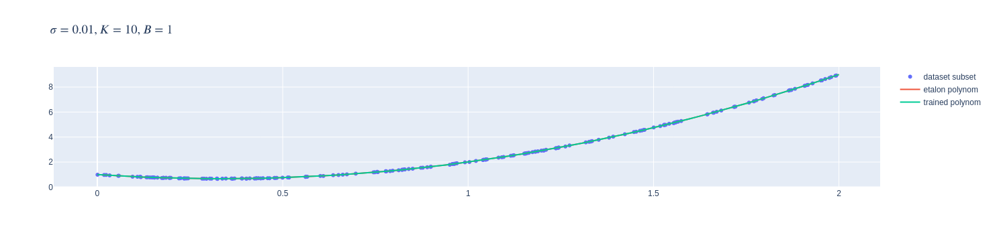

In [4]:
subset_idx = np.random.choice(range(len(x)), 200)
fig = go.Figure(
    [
        go.Scatter(
            x=x[subset_idx],
            y=y[subset_idx],
            mode="markers",
            name="dataset subset",
            showlegend=True,
        ),
        go.Scatter(
            x=x_plotting,
            y=etalon_polynom(x_plotting),
            name="etalon polynom",
            showlegend=True,
        ),
        go.Scatter(
            x=x_plotting,
            y=etalon_polynom(x_plotting),
            name="trained polynom",
            showlegend=True,
        ),
    ]
)
fig.update_layout(title=f"$\sigma={sigma}, K={K}, B={B}$")
fig.show()

# Загальні розрахунки

In [5]:
optimizer_classes = [optimizers.SGD, optimizers.Momentum]
K_list = [10, 30, 100, 1000]
B_list = [64, 32, 8, 1]

In [9]:
def fit(sigma: float) -> tuple[dict, list]:
    x, y = generate_data(a, b, c, N, sigma)
    history = {}
    records = []

    for B, K, optimizer_cls in tqdm(
        product(B_list, K_list, optimizer_classes),
        "Total",
        total=len(optimizer_classes) * len(K_list) * len(B_list),
    ):
        poly_fn = Polynom()
        loss_fn = losses.MSELoss()
        optimizer = optimizer_cls(
            poly_fn,
            loss_fn,
            lr,
        )
        loss_history = optimizer.fit(
            x, y, K, B, epoch_verbose=False, total_verbose=True, keep_total_pbar=False
        )
        etalon_mse = loss_fn(etalon_polynom.weights, poly_fn.weights)
        history[(optimizer_cls.__name__, K, B)] = {
            "loss_history": loss_history,
            "poly_fn": poly_fn,
            "etalon_mse": etalon_mse,
        }
        records.append(
            {
                "optimizer": optimizer_cls.__name__,
                "K": K,
                "B": B,
                "a": poly_fn.weights[0],
                "b": poly_fn.weights[1],
                "c": poly_fn.weights[2],
                "Etalon MSE": etalon_mse,
            }
        )
    return history, pd.DataFrame.from_records(records)


def plot_fitted_fns(history: dict):
    subset_idx = np.random.choice(range(len(x)), 200)
    fig = go.Figure(
        [
            go.Scatter(
                x=x[subset_idx],
                y=y[subset_idx],
                mode="markers",
                name="dataset subset",
                showlegend=True,
            ),
            go.Scatter(
                x=x_plotting,
                y=etalon_polynom(x_plotting),
                name="Etalon",
                showlegend=True,
            ),
        ]
        + [
            go.Scatter(
                x=x_plotting,
                y=data["poly_fn"](x_plotting),
                name=f"Optimizer: {opt_name}, K: {K}, B: {B}",
                showlegend=True,
            )
            for (opt_name, K, B), data in history.items()
        ]
    )
    fig.update_layout(title=f"$\sigma={sigma}$", height=800)
    fig.show()

    
def plot_loss_history(history: dict):
    fig = go.Figure(
        [
            go.Scatter(
                x=np.arange(0, len(data["loss_history"])),
                y=data["loss_history"],
                name=f"Optimizer: {opt_name}, K: {K}, B: {B}",
                showlegend=True,
            )
            for (opt_name, K, B), data in history.items()
        ]
    )
    fig.update_layout(title=f"$\sigma={sigma}$", height=800)
    fig.show()

### $\sigma=0.01$

In [7]:
history, records = fit(0.01)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,1.999384,0.150566,0.179394,2.099853e+00
1,Momentum,10,64,2.603244,-1.145375,0.673720,3.314193e-01
2,SGD,30,64,2.741409,-1.443979,0.787816,1.403502e-01
3,Momentum,30,64,2.961826,-1.917171,0.968398,3.105530e-03
4,SGD,100,64,2.986028,-1.969649,0.988399,4.169838e-04
5,Momentum,100,64,3.000164,-1.999688,0.999904,4.456824e-08
6,SGD,1000,64,3.000212,-2.000131,1.000030,2.099471e-08
7,Momentum,1000,64,3.000342,-2.000072,1.000051,4.167222e-08
8,SGD,10,32,2.299382,-0.488854,0.423614,1.035550e+00
9,Momentum,10,32,2.679042,-1.305589,0.734076,2.186452e-01


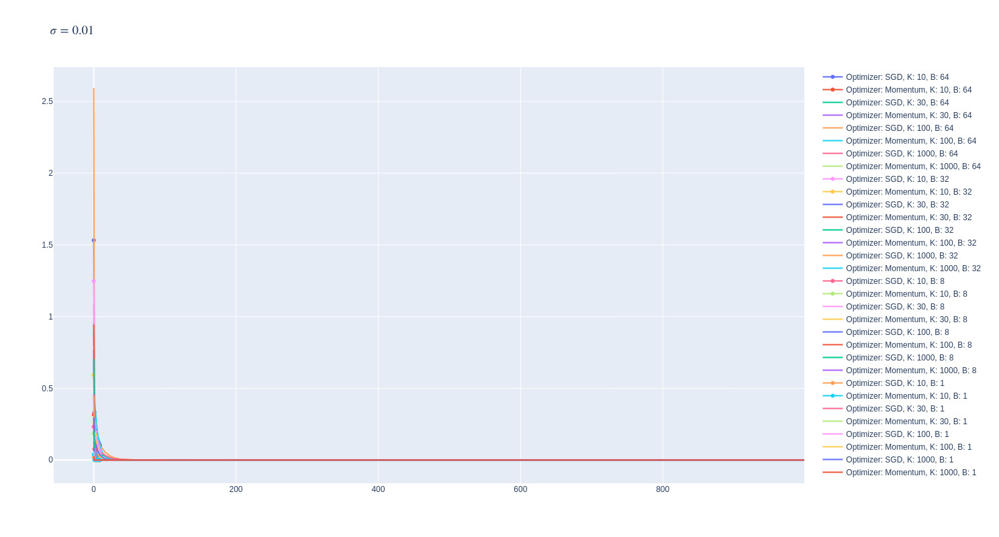

In [10]:
plot_loss_history(history)

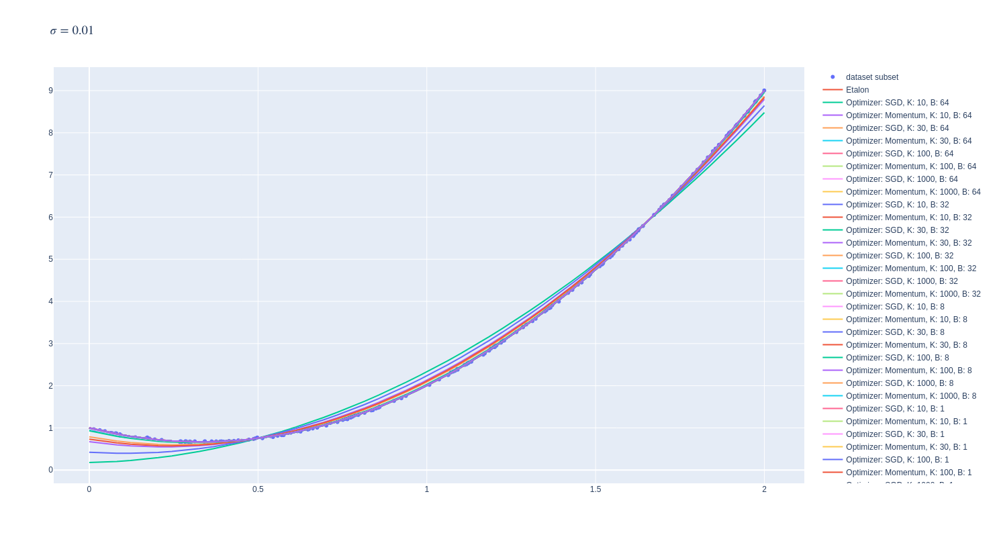

In [11]:
plot_fitted_fns(history)

### $\sigma=0.1$

In [12]:
history, records = fit(0.1)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,1.574859,1.059546,-0.174314,4.256955
1,Momentum,10,64,2.314742,-0.528038,0.433710,0.985645
2,SGD,30,64,2.676978,-1.307973,0.732156,0.218328
3,Momentum,30,64,2.898607,-1.784681,0.914371,0.021325
4,SGD,100,64,2.990494,-1.981451,0.990015,0.000178
5,Momentum,100,64,3.002168,-2.007574,0.999627,0.000021
6,SGD,1000,64,3.002685,-2.007640,1.000042,0.000022
7,Momentum,1000,64,3.002254,-2.007758,0.999697,0.000022
8,SGD,10,32,2.642752,-1.234441,0.704286,0.267051
9,Momentum,10,32,2.738057,-1.439647,0.782906,0.143246


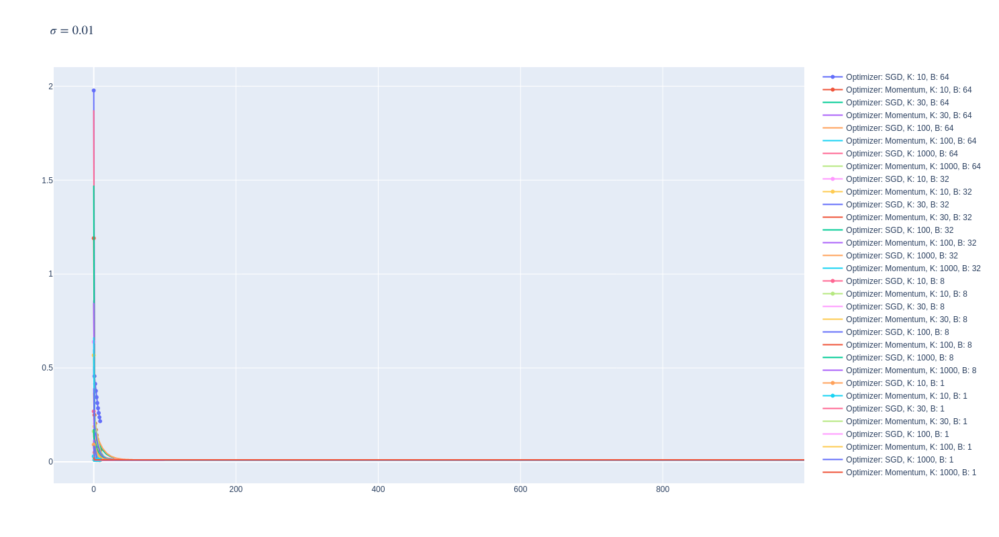

In [13]:
plot_loss_history(history)

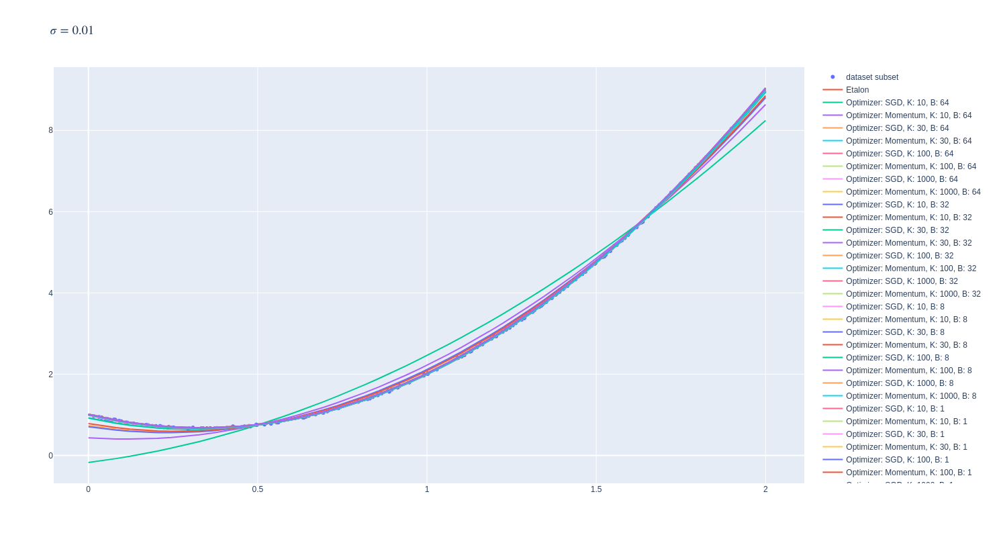

In [14]:
plot_fitted_fns(history)

### $\sigma=0.5$

In [15]:
history, records = fit(0.5)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,2.480872,-0.875177,0.565856,0.574400
1,Momentum,10,64,2.594938,-1.112859,0.655432,0.356607
2,SGD,30,64,2.636775,-1.206313,0.693504,0.285271
3,Momentum,30,64,2.912521,-1.786398,0.916081,0.020107
4,SGD,100,64,2.973855,-1.922266,0.969494,0.002552
5,Momentum,100,64,2.988610,-1.947770,0.978529,0.001106
6,SGD,1000,64,2.985608,-1.947230,0.979117,0.001143
7,Momentum,1000,64,2.988742,-1.948048,0.978637,0.001094
8,SGD,10,32,2.551197,-1.009809,0.617779,0.442665
9,Momentum,10,32,2.712251,-1.319466,0.743063,0.203981


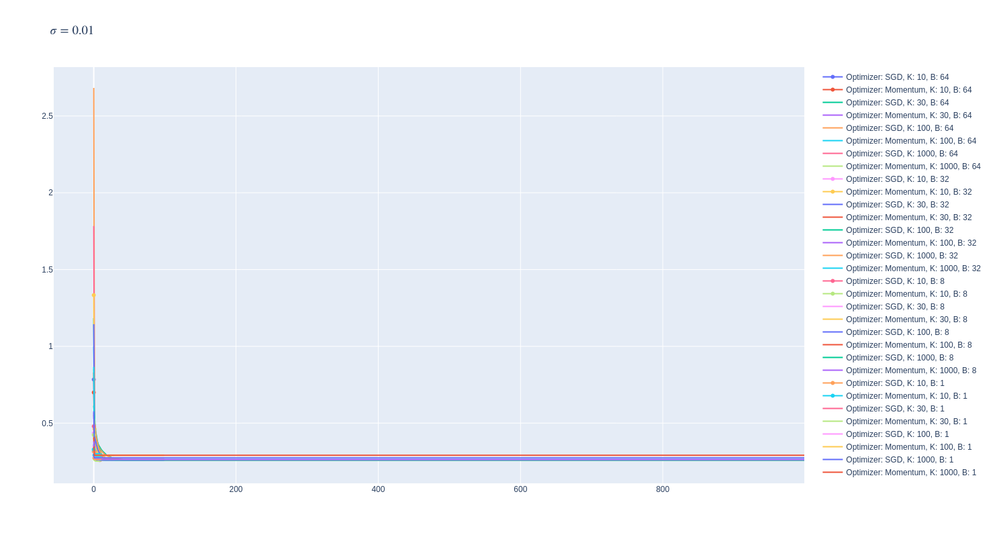

In [16]:
plot_loss_history(history)

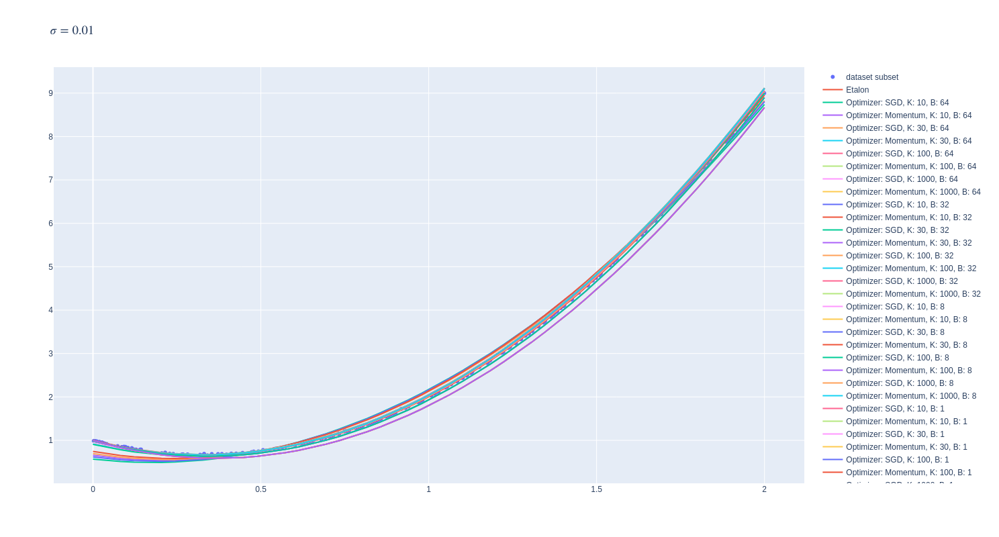

In [17]:
plot_fitted_fns(history)

### $\sigma=1$

In [18]:
history, records = fit(1)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,1.941640,0.240515,0.125017,2.301877
1,Momentum,10,64,2.631928,-1.265494,0.689464,0.257136
2,SGD,30,64,2.538294,-1.032752,0.609093,0.433850
3,Momentum,30,64,2.875796,-1.785444,0.886241,0.024801
4,SGD,100,64,2.946192,-1.903219,0.940036,0.005286
5,Momentum,100,64,2.941339,-1.925188,0.939128,0.004248
6,SGD,1000,64,2.952956,-1.917654,0.945524,0.003987
7,Momentum,1000,64,2.941402,-1.925321,0.939178,0.004237
8,SGD,10,32,2.361281,-0.699103,0.473939,0.792346
9,Momentum,10,32,2.755950,-1.605173,0.803184,0.084729


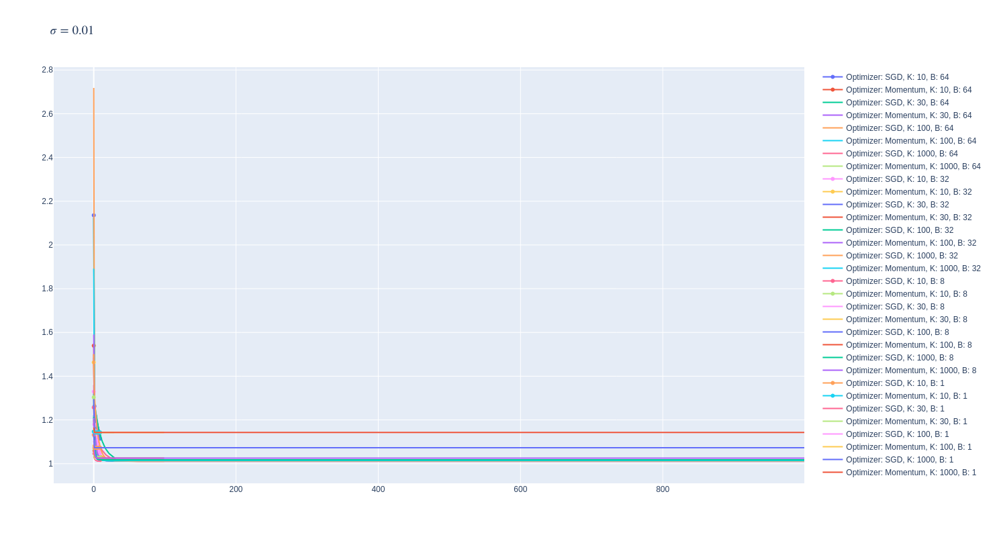

In [19]:
plot_loss_history(history)

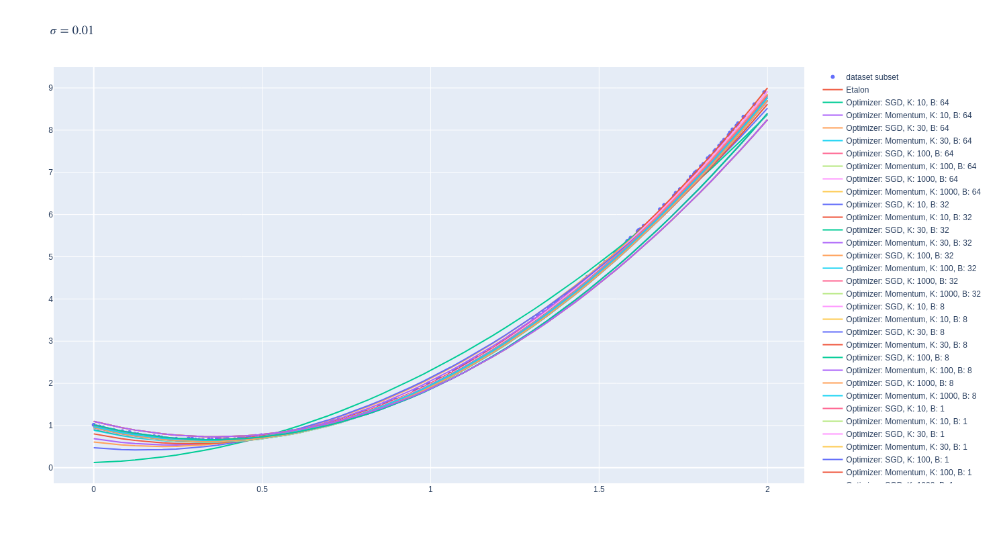

In [20]:
plot_fitted_fns(history)

### $\sigma=10$

In [21]:
history, records = fit(10)
records

Total:   0%|          | 0/32 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/10 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/30 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/100 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

Model:   0%|          | 0/1000 [00:00<?, ?it/s]

,optimizer,K,B,a,b,c,Etalon MSE
0,SGD,10,64,2.242345,-0.850226,0.691326,0.663767
1,Momentum,10,64,2.610813,-1.789893,1.057649,0.066312
2,SGD,30,64,2.748419,-1.933285,1.103360,0.026142
3,Momentum,30,64,2.779345,-2.151039,1.195081,0.036519
4,SGD,100,64,2.886460,-2.228710,1.215750,0.037249
5,Momentum,100,64,2.845302,-2.292378,1.248867,0.057117
6,SGD,1000,64,2.895819,-2.248740,1.223370,0.040873
7,Momentum,1000,64,2.845376,-2.292537,1.248927,0.057150
8,SGD,10,32,2.432687,-1.297945,0.876979,0.276620
9,Momentum,10,32,2.498245,-1.782038,1.048048,0.100525


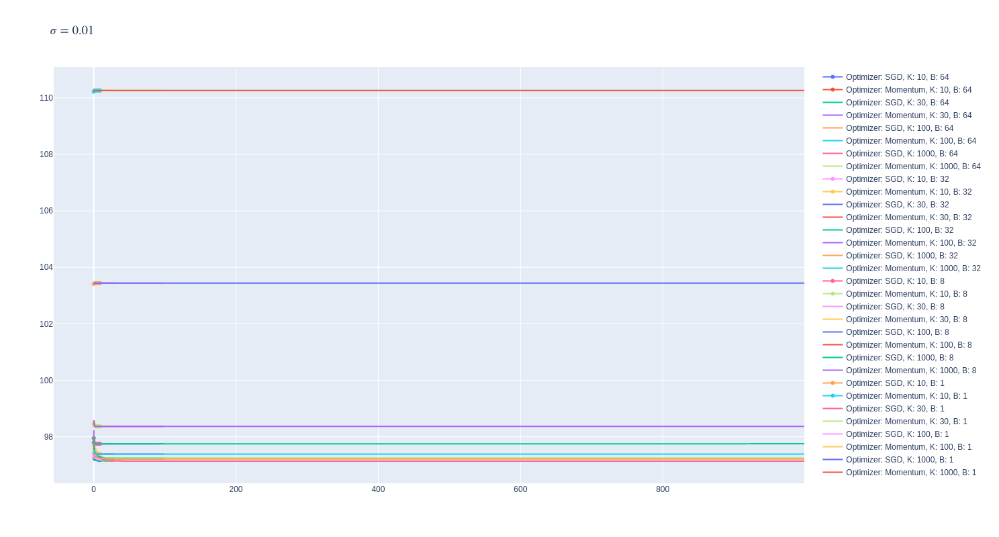

In [22]:
plot_loss_history(history)

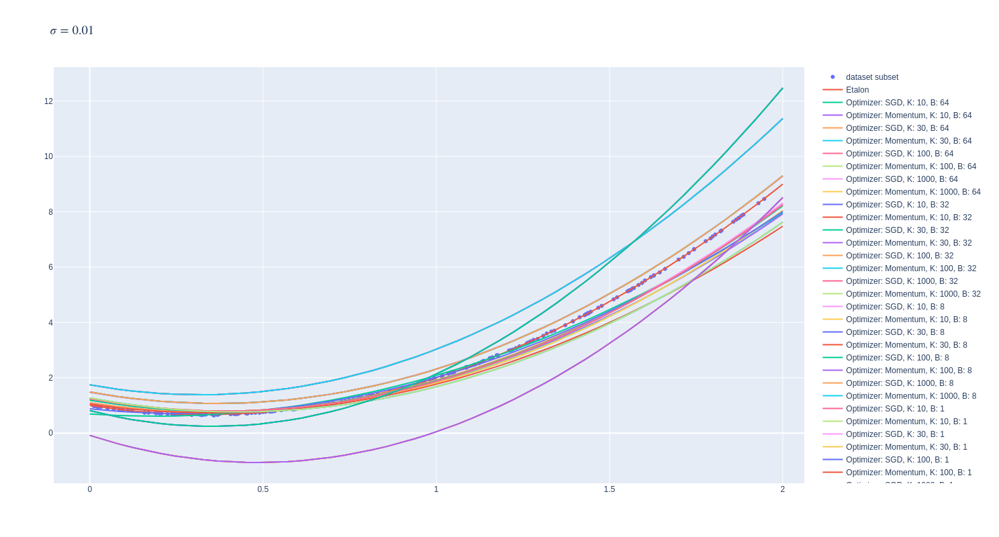

In [23]:
plot_fitted_fns(history)